In [1]:
%load_ext autoreload
%autoreload 2

# Extended metrics

LCS, match-rate, divergence-point, token-accuracy, paired PPL/NLL/TTR, and Rouge-L distribution, for full-scf1/sink-scf1/gated-scf1/swa-w1024-scf1/gdn. Rouge-L itself is the headline metric and lives per-family in attn_types.ipynb etc.

In [ ]:
import os
import sys

PDM_DIR = os.environ.get('PDM_DIR', '../../../PDM')
sys.path.append(f'{PDM_DIR}/src')
import verbatim_eval.controlled_expr as _ce
import verbatim_eval.rouge_ttr as _rt
import verbatim_eval.utils as _ut
sys.modules['controlled_expr'] = _ce  # needed for pickle deserialization
sys.modules['rouge_ttr'] = _rt
sys.modules['utils'] = _ut

sys.path.insert(0, '../..')
from attn_bench.plotting import model_registry
from attn_bench.plotting.data_loading import load_mem_results_scores_grid
from attn_bench.plotting.heatmap import plot_models_heatmap_panel
from attn_bench.plotting.utils import plot_lineplot_panel
from attn_bench.plotting.rouge_l import plot_rouge_hist, plot_rouge_heatmap

## Load memorization results

In [3]:
MODELS = ['full-scf1', 'sink-scf1', 'gated-scf1', 'swa-w1024-scf1', 'gdn']

OFFSETS = [0, 1, 5, 12, 25, 50, 100, 500, 1000, 2000, 3000]
PREFIXES = [50, 100, 250, 500, 750, 1000, 2000, 3000]
SUFFIXES = [50, 500]

results_grid = load_mem_results_scores_grid(
    OFFSETS, PREFIXES, SUFFIXES, models=MODELS, results_base=model_registry.MEM_RESULTS_DIR
)

In [4]:
# prefix sweep (varying prefix at fixed offset=0/suffix=500) only exists broadly for gdn --
# the other 4 current models only have the prefix=500 point. Used below to restrict the
# prefix-dim panels instead of showing mostly-empty columns.
shared_prefixes = [p for p in PREFIXES if all(m in results_grid.get((0, p, 500), {}) for m in MODELS)]

### LCS
Token-level longest common subsequence between generated and reference suffix, divided by suffix length -> [0, 1]. Measures shared token subsequence regardless of position; 1.0 = perfect reproduction.

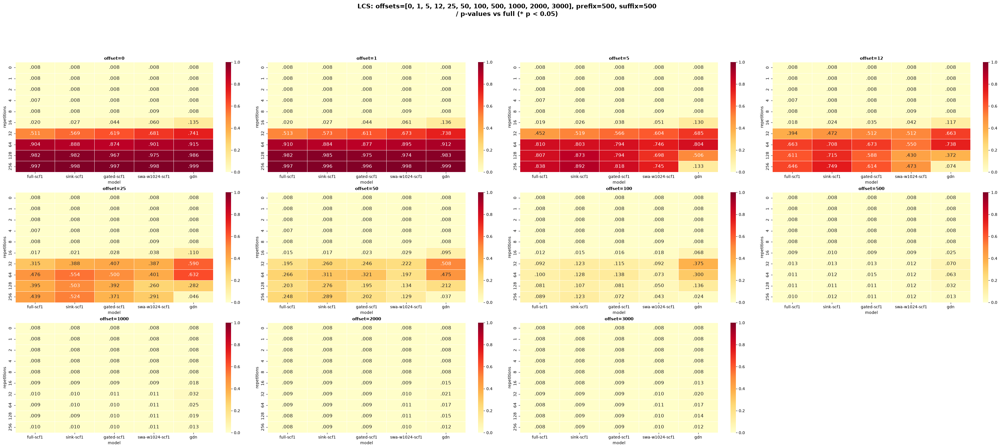

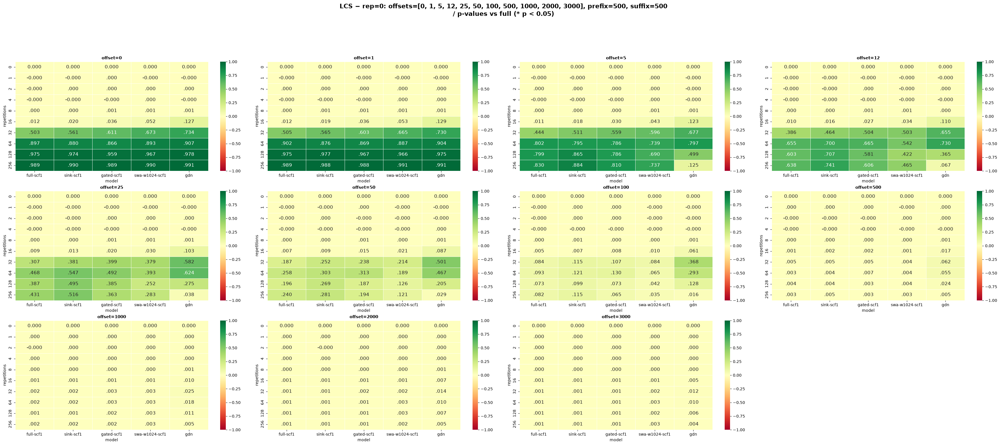

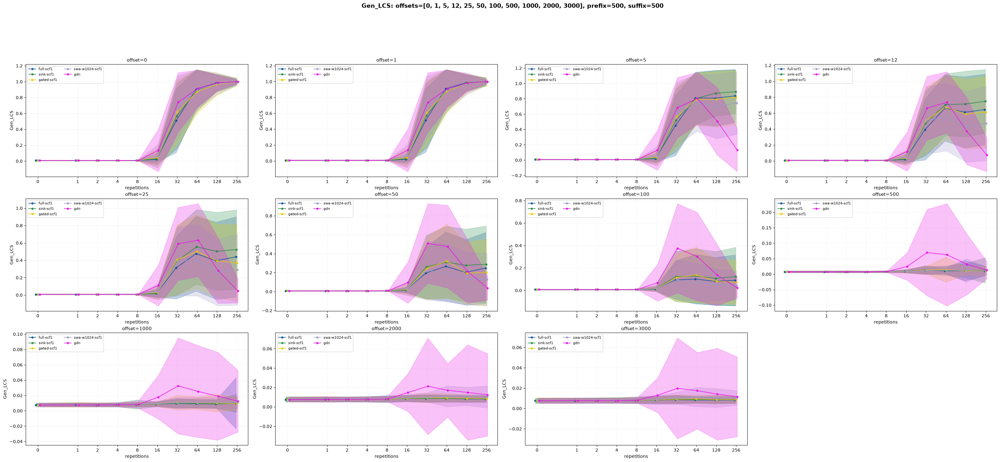

In [5]:
# fixed_prefix=500, not 50 -- prefix=50 was only ever swept across offsets for gdn, the
# other 4 current models only have the offset=0 point there. prefix=500 is fully covered
# across every offset for all 5.
plot_models_heatmap_panel(results_grid, 'LCS', panels='offset', values=OFFSETS, fixed_prefix=500)
plot_models_heatmap_panel(results_grid, 'LCS', panels='offset', values=OFFSETS, fixed_prefix=500, normalize='subtract')
plot_lineplot_panel(results_grid, 'LCS', panels='offset', values=OFFSETS, fixed_prefix=500)

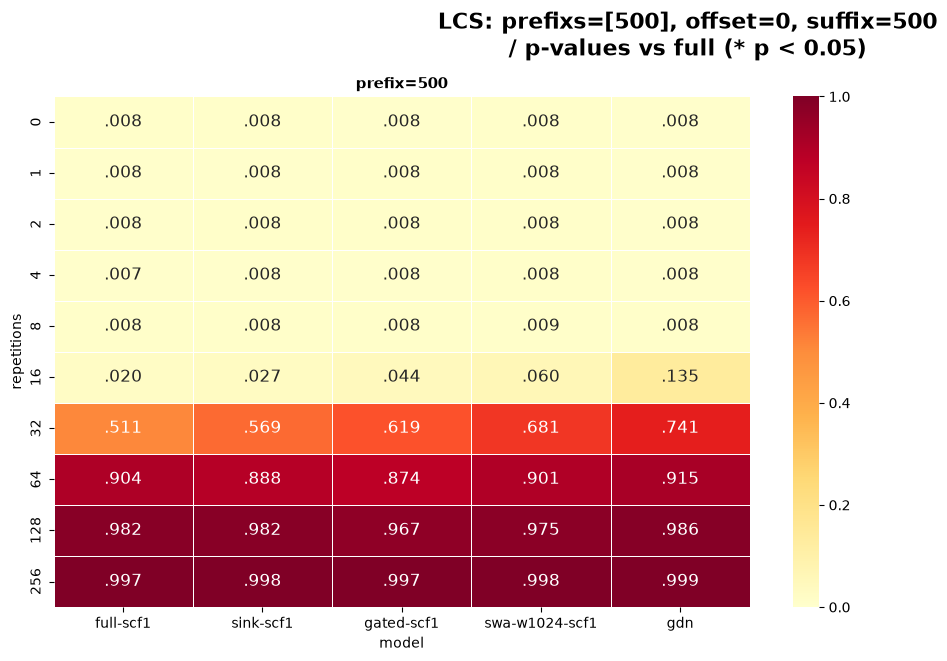

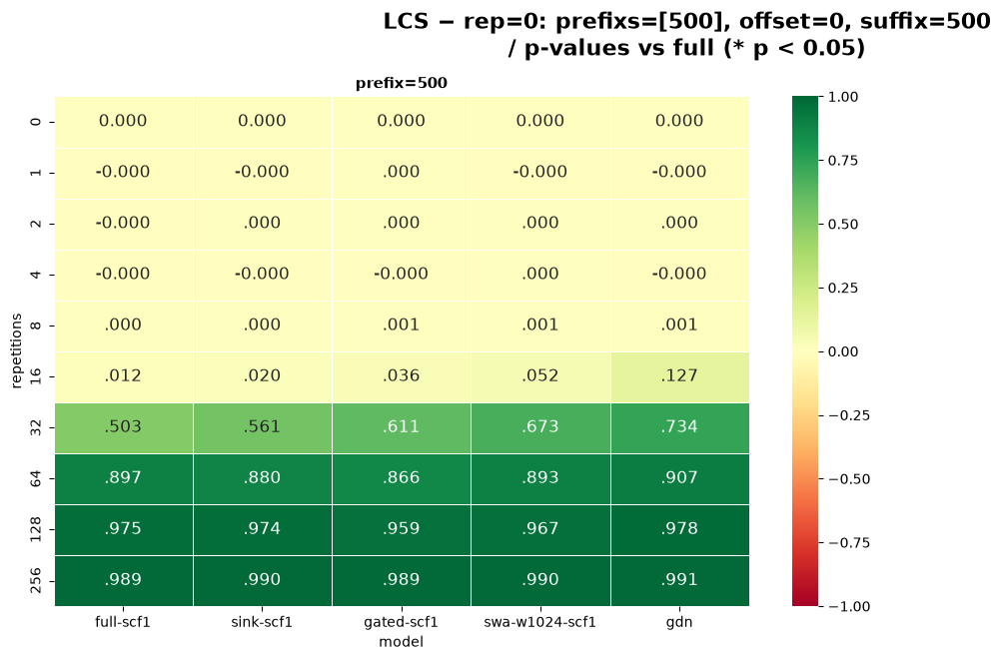

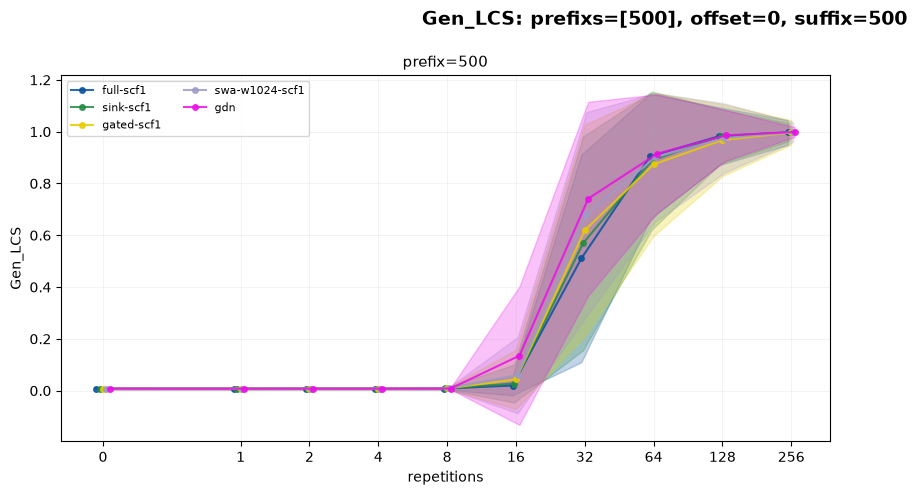

In [6]:
plot_models_heatmap_panel(results_grid, 'LCS', panels='prefix', values=shared_prefixes)
plot_models_heatmap_panel(results_grid, 'LCS', panels='prefix', values=shared_prefixes, normalize='subtract')
plot_lineplot_panel(results_grid, 'LCS', panels='prefix', values=shared_prefixes)

### Match
Threshold buckets derived from `lcs_norm`: fraction of samples where lcs_norm >= threshold. `exact_match` = lcs_norm == 1.0 (generated suffix is a subsequence covering 100% of reference tokens). Values are percentages over the sample set.

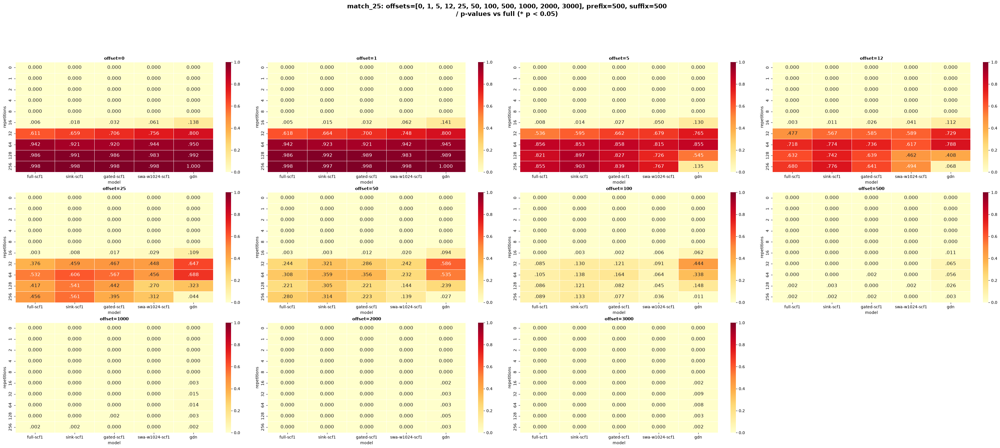

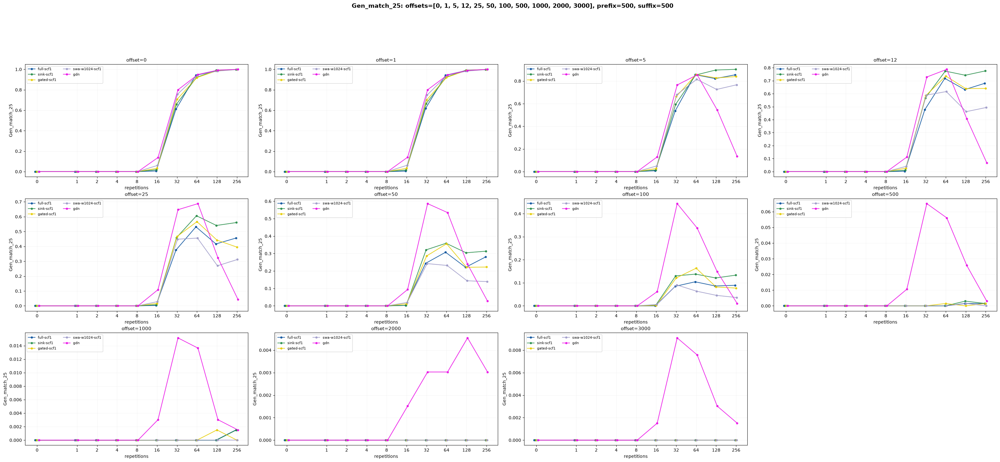

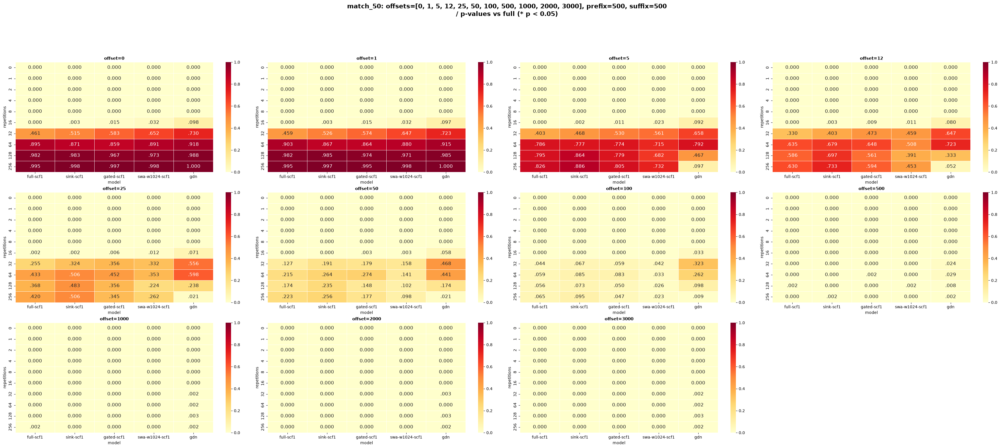

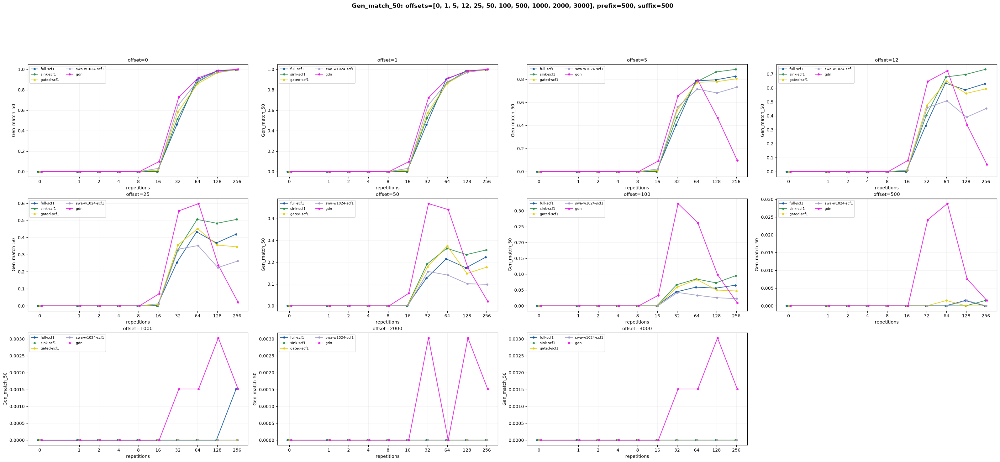

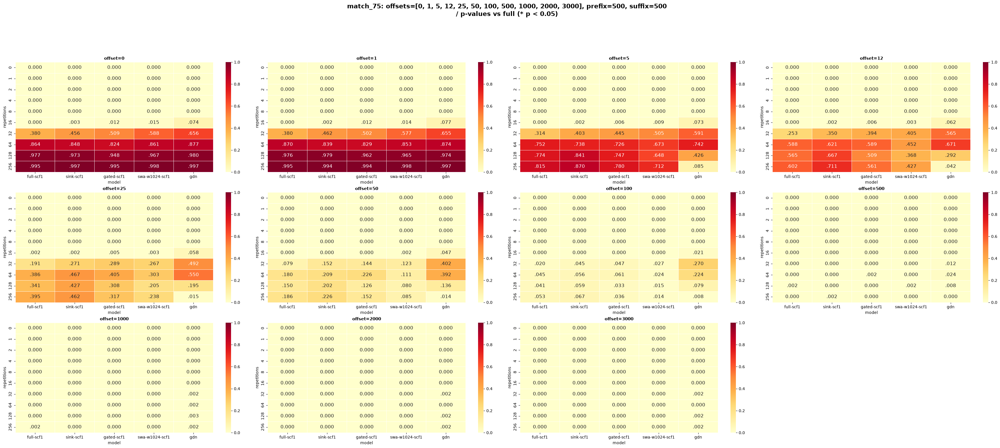

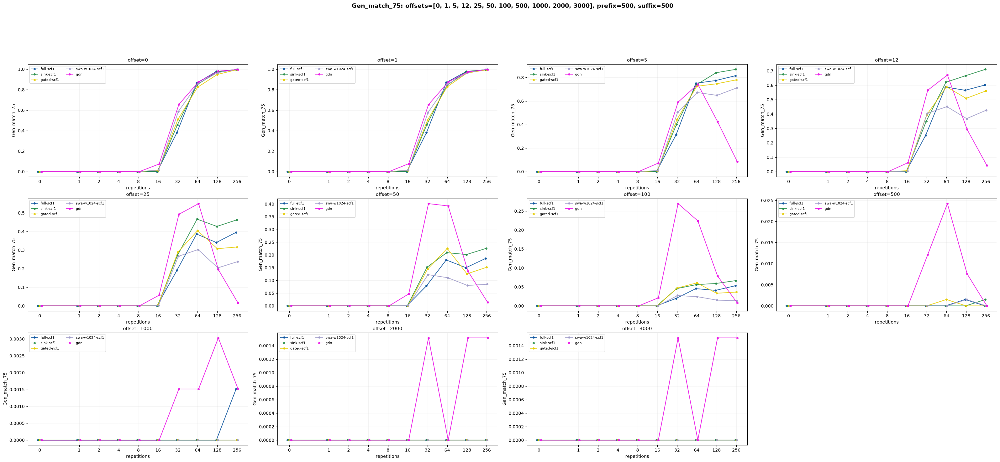

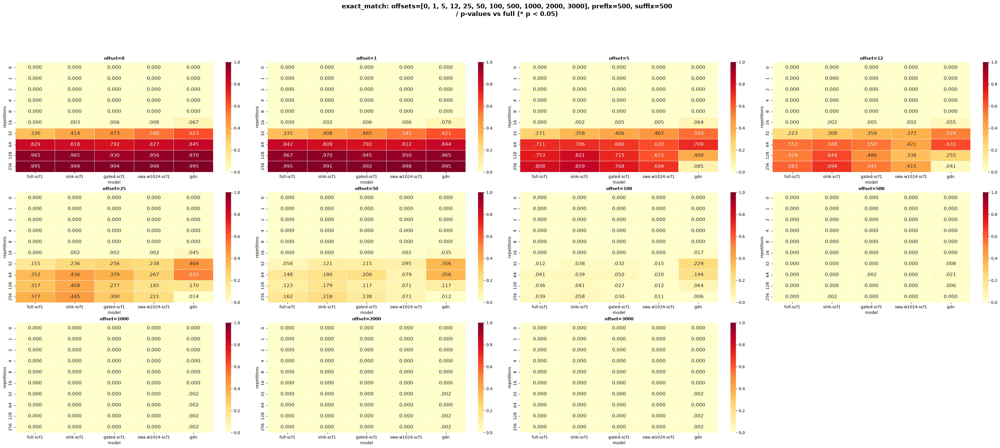

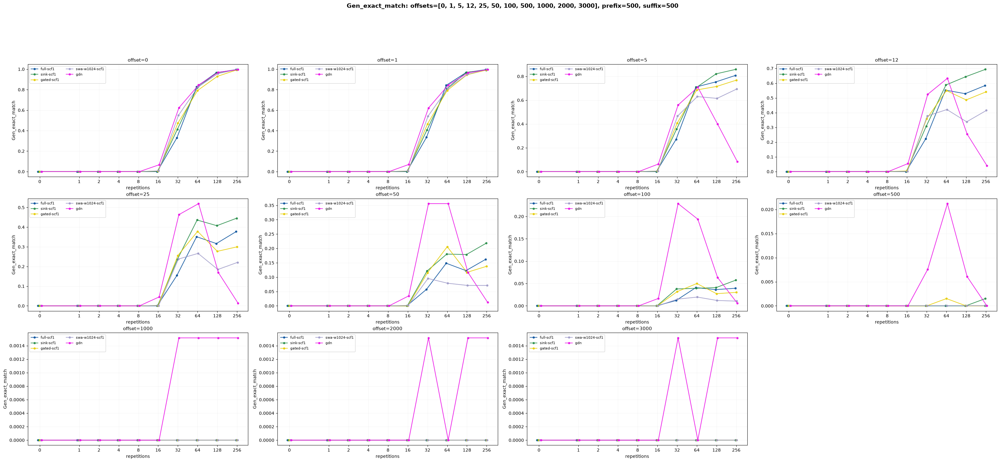

In [7]:
# fixed_prefix=500, same reason as LCS above
for metric in ['match_25', 'match_50', 'match_75', 'exact_match']:
    plot_models_heatmap_panel(results_grid, metric, panels='offset', values=OFFSETS, fixed_prefix=500)
    plot_lineplot_panel(results_grid, metric, panels='offset', values=OFFSETS, fixed_prefix=500)

### Divergence point
First position where generation diverges, normalised to [0, 1]

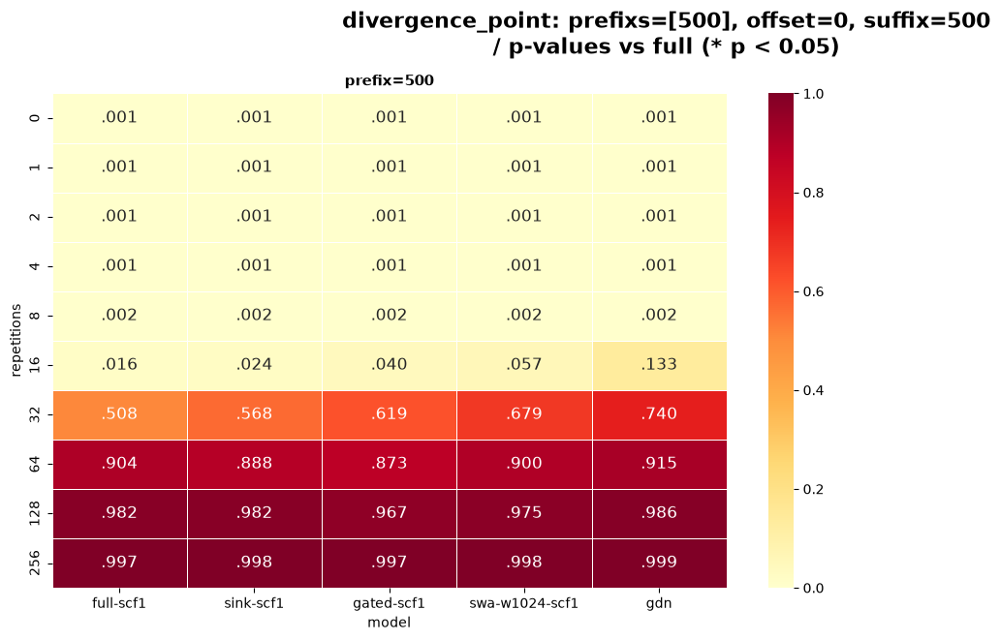

In [8]:
# plot_models_heatmap_panel(results_grid, 'divergence_point', panels='offset', values=OFFSETS, fixed_prefix=500)
plot_models_heatmap_panel(results_grid, 'divergence_point', panels='prefix', values=shared_prefixes)

### Token-level accuracy
Fraction of suffix tokens correct in position

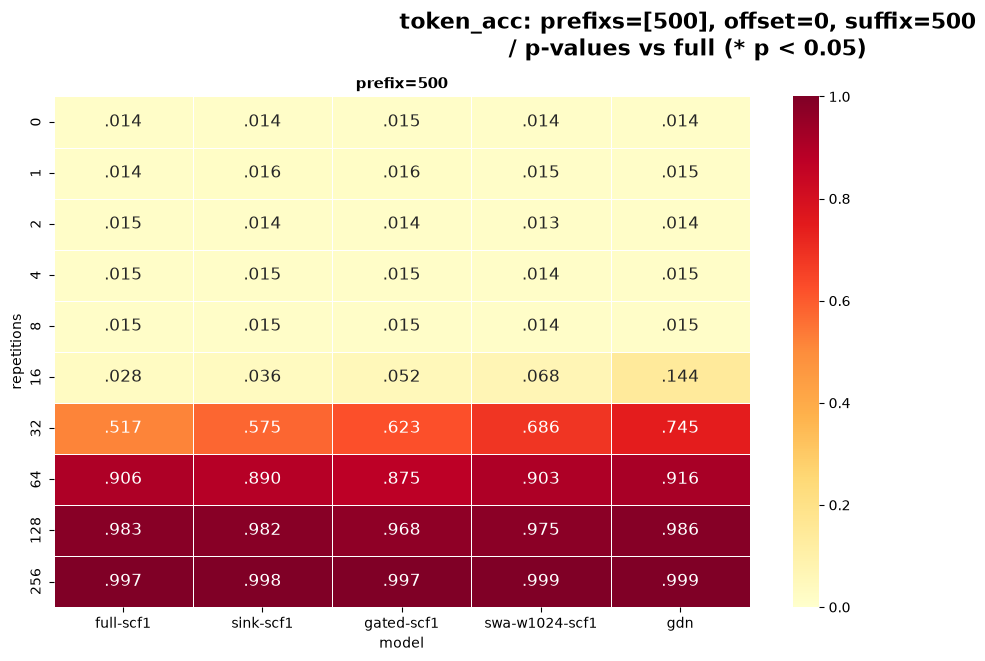

In [9]:
# plot_models_heatmap_panel(results_grid, 'token_acc', panels='suffix', values=SUFFIXES)
plot_models_heatmap_panel(results_grid, 'token_acc', panels='prefix', values=shared_prefixes)

### PAIRED METRICS (REF/GEN)
Perplexity, Negative Log-Likelihood, Type-Token Ratio

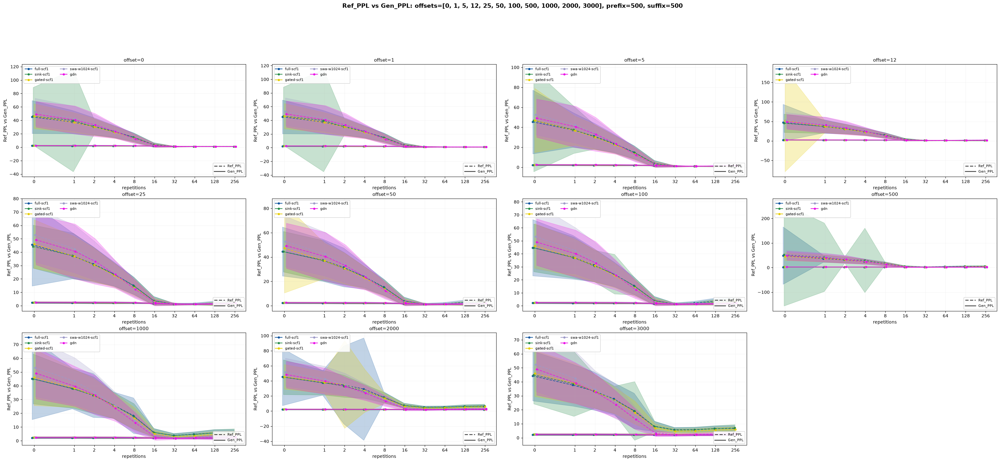

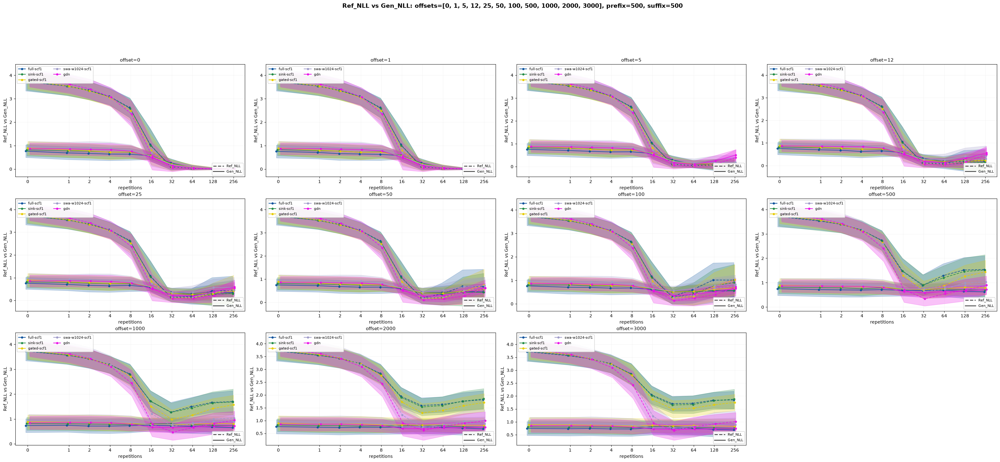

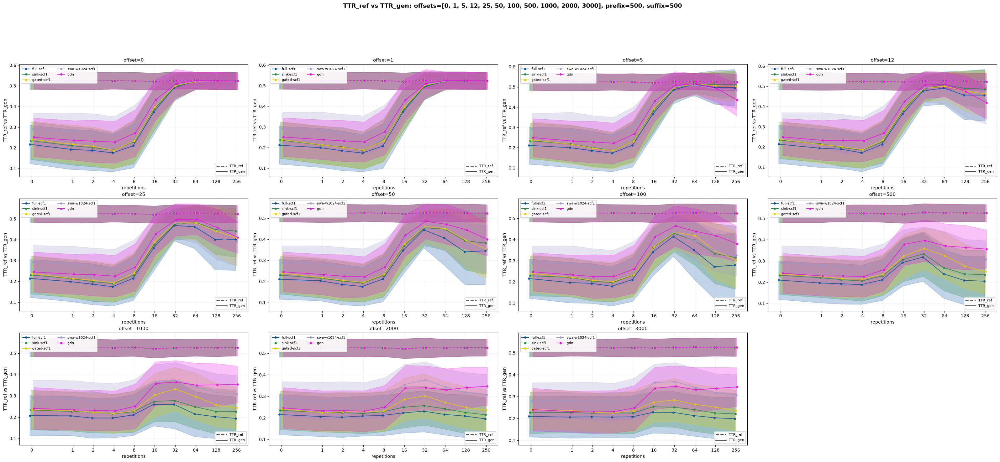

In [10]:
# fixed_prefix=500, fixed_suffix=500 -- prefix=50/suffix=50 has zero data for 3 of 5
# models (sink-scf1/gated-scf1/swa-w1024-scf1), only a single offset=0 point for
# full-scf1. 500/500 is fully covered across every offset for all 5.
plot_lineplot_panel(results_grid, metric_pair=('Ref_PPL', 'PPL'),     panels='offset', values=OFFSETS, fixed_prefix=500, fixed_suffix=500)
plot_lineplot_panel(results_grid, metric_pair=('Ref_NLL', 'NLL'),     panels='offset', values=OFFSETS, fixed_prefix=500, fixed_suffix=500)
plot_lineplot_panel(results_grid, metric_pair=('TTR_ref', 'TTR_gen'), panels='offset', values=OFFSETS, fixed_prefix=500, fixed_suffix=500)

### ROUGE-L DISTRIBUTION
Per-snippet Rouge-L histograms (overlaid by rep) and rep x Rouge-L-bin heatmaps (row-normalised fraction).

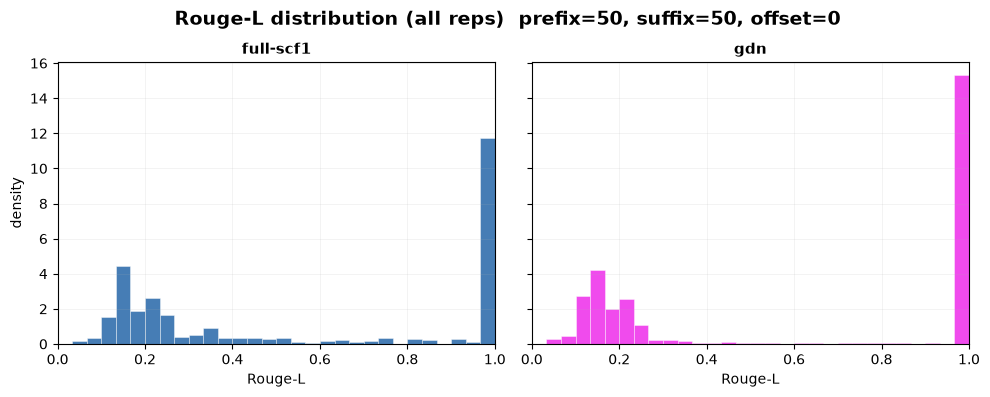

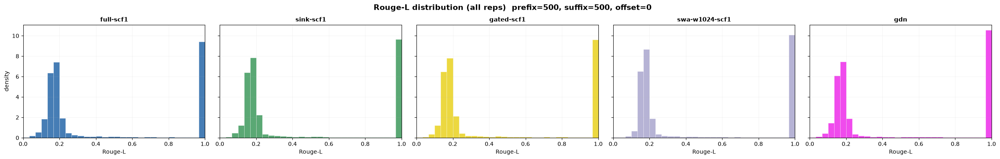

In [11]:
entry_50 = results_grid[(0, 50, 50)]
entry_500 = results_grid[(0, 500, 500)]

plot_rouge_hist(entry_50, prefix=50, suffix=50)
plot_rouge_hist(entry_500, prefix=500, suffix=500)

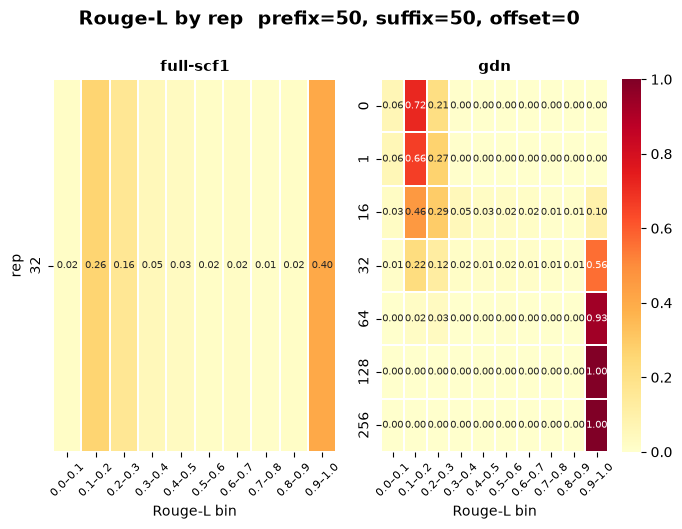

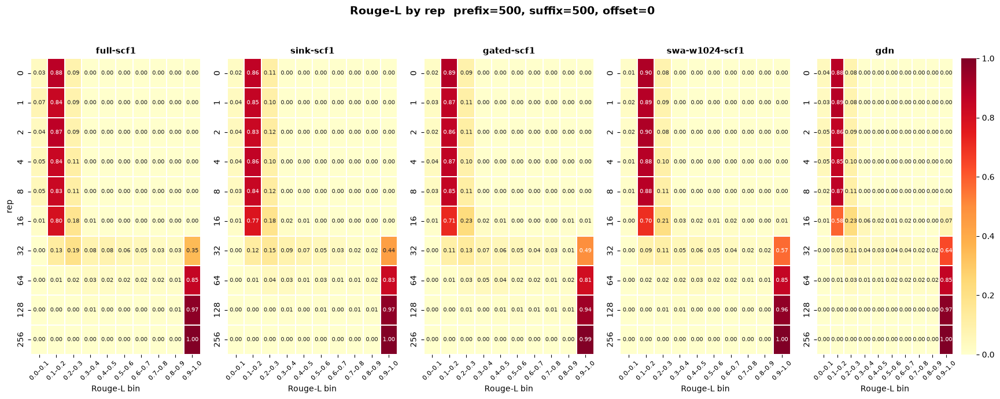

In [12]:
plot_rouge_heatmap(entry_50, prefix=50, suffix=50)
plot_rouge_heatmap(entry_500, prefix=500, suffix=500)